# Dog-Cat Image Classification

## Fire up turicreate 

In [4]:
import turicreate as tc

## Loading Data

In [15]:
data = tc.image_analysis.load_images('archive (1)/dataset')

In [16]:
data['label'] = data['path'].apply(lambda path: 'Dog' if '/dog' in path else 'Cat')

In [17]:
data

path,image,label
/home/astha/archive (1)/dataset/test_set/cats/ ...,Height: 415 Width: 498,Cat
/home/astha/archive (1)/dataset/test_set/cats/ ...,Height: 499 Width: 375,Cat
/home/astha/archive (1)/dataset/test_set/cats/ ...,Height: 399 Width: 500,Cat
/home/astha/archive (1)/dataset/test_set/cats/ ...,Height: 375 Width: 499,Cat
/home/astha/archive (1)/dataset/test_set/cats/ ...,Height: 359 Width: 360,Cat
/home/astha/archive (1)/dataset/test_set/cats/ ...,Height: 334 Width: 499,Cat
/home/astha/archive (1)/dataset/test_set/cats/ ...,Height: 310 Width: 174,Cat
/home/astha/archive (1)/dataset/test_set/cats/ ...,Height: 375 Width: 499,Cat
/home/astha/archive (1)/dataset/test_set/cats/ ...,Height: 500 Width: 335,Cat
/home/astha/archive (1)/dataset/test_set/cats/ ...,Height: 412 Width: 500,Cat


In [18]:
data.save('Cat-Dog.sframe')

In [20]:
data = tc.SFrame('Cat-Dog.sframe')

## Splitting Data

In [21]:
training_set, test_set = data.random_split(.8)

## Creating Model

In [22]:
model = tc.image_classifier.create(training_set, target='label')

Performing feature extraction on resized images...
Completed   64/2969
Completed  128/2969
Completed  192/2969
Completed  256/2969
Completed  320/2969
Completed  384/2969
Completed  448/2969
Completed  512/2969
Completed  576/2969
Completed  640/2969
Completed  704/2969
Completed  768/2969
Completed  832/2969
Completed  896/2969
Completed  960/2969
Completed 1024/2969
Completed 1088/2969
Completed 1152/2969
Completed 1216/2969
Completed 1280/2969
Completed 1344/2969
Completed 1408/2969
Completed 1472/2969
Completed 1536/2969
Completed 1600/2969
Completed 1664/2969
Completed 1728/2969
Completed 1792/2969
Completed 1856/2969
Completed 1920/2969
Completed 1984/2969
Completed 2048/2969
Completed 2112/2969
Completed 2176/2969
Completed 2240/2969
Completed 2304/2969
Completed 2368/2969
Completed 2432/2969
Completed 2496/2969
Completed 2560/2969
Completed 2624/2969
Completed 2688/2969
Completed 2752/2969
Completed 2816/2969
Completed 2880/2969
Completed 2944/2969
Completed 2969/2969
PROGRESS:

Logistic regression:

--------------------------------------------------------

Number of examples          : 2820

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 2048

Number of coefficients      : 2049

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 2        | 1.000000  | 1.862421     | 0.984752          | 0.986577            |

| 1         | 5        | 0.500000  | 3.663498     | 0.984752          | 0.959732            |

| 2         | 7        | 0.599543  | 4.913371     | 0.985461          | 0.959732            |

| 3         | 9        | 0.599543  | 6.201776     | 0.993262          | 0.973154            |

| 4         | 10       | 0.749429  | 7.210818     | 0.996099          | 0.973154            |

| 9         | 19       | 0.663085  | 13.553027    | 0.999645          | 0.966443            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

In [23]:
predictions = model.predict(test_set)

## Evaluating Model

In [25]:
result = model.evaluate(test_set)
result

Performing feature extraction on resized images...
Completed  64/759
Completed 128/759
Completed 192/759
Completed 256/759
Completed 320/759
Completed 384/759
Completed 448/759
Completed 512/759
Completed 576/759
Completed 640/759
Completed 704/759
Completed 759/759


{'accuracy': 0.9920948616600791,
 'f1_score': 0.9922077922077923,
 'log_loss': 0.04784999542543734,
 'precision': 0.9947916666666666,
 'recall': 0.9896373056994818,
 'auc': 0.99722179777466,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 1001
 
 Data:
 +-----------+----------------------+--------------------+-----+-----+
 | threshold |         fpr          |        tpr         |  p  |  n  |
 +-----------+----------------------+--------------------+-----+-----+
 |    0.0    |         1.0          |        1.0         | 386 | 373 |
 |   0.001   | 0.021447721179624665 | 0.9948186528497409 | 386 | 373 |
 |   0.002   | 0.01876675603217158  | 0.9896373056994818 | 386 | 373 |
 |   0.003   | 0.01876675603217158  | 0.9896373056994818 | 386 | 373 |
 |   0.004   |  0.0160857908847185  | 0.9896373056994818 | 386 | 373 |
 |   0.005   | 0.013404825737265416 | 0.9896373056994818 | 386 | 373 |
 |   0.006   | 0.013404825737265416 | 0.9896373056994818 | 386 | 3

In [97]:
result['accuracy']

0.9920948616600791

In [26]:
predictions.show()

Materializing SArray

## Exploring Test Data

/home/astha/.local/lib/python3.8/site-packages/turicreate/visualization/_plot.py:461: UserWarning: Displaying only the first 100 rows.
  warnings.warn("Displaying only the first {} rows.".format(maximum_rows))


,path,image,label,predictions
0,/home/astha/archive (1)/dataset/test_set/cats/cat.4004.jpg,,Cat,Cat
1,/home/astha/archive (1)/dataset/test_set/cats/cat.4007.jpg,,Cat,Cat
2,/home/astha/archive (1)/dataset/test_set/cats/cat.4025.jpg,,Cat,Cat
3,/home/astha/archive (1)/dataset/test_set/cats/cat.4027.jpg,,Cat,Cat
4,/home/astha/archive (1)/dataset/test_set/cats/cat.4034.jpg,,Cat,Cat
5,/home/astha/archive (1)/dataset/test_set/cats/cat.4039.jpg,,Cat,Cat
6,/home/astha/archive (1)/dataset/test_set/cats/cat.4041.jpg,,Cat,Cat
7,/home/astha/archive (1)/dataset/test_set/cats/cat.4045.jpg,,Cat,Cat
8,/home/astha/archive (1)/dataset/test_set/cats/cat.4053.jpg,,Cat,Cat
9,/home/astha/archive (1)/dataset/test_set/cats/cat.4056.jpg,,Cat,Cat

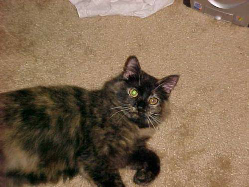
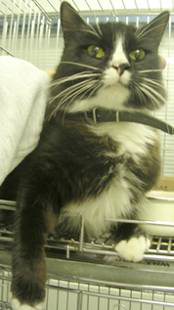
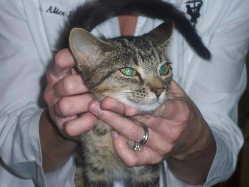
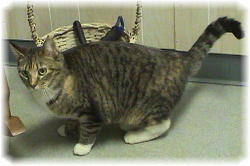
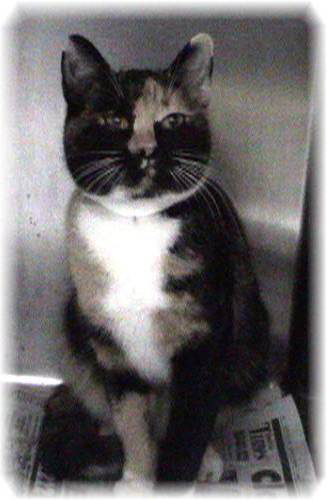
...
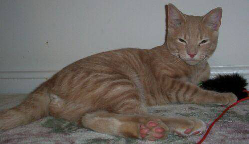
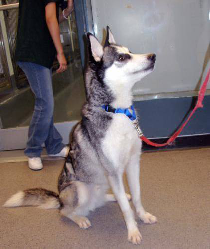
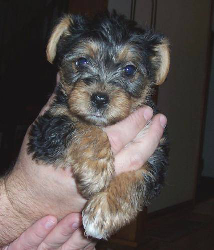
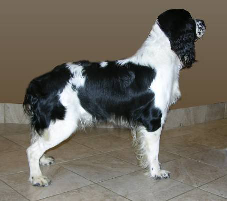
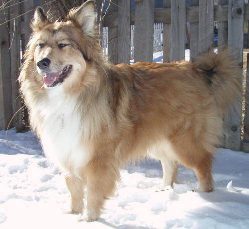

In [90]:
test_set['predictions'] = model.predict(test_set)
test_set.explore()

In [28]:
model.save('Cat-Dog.model')

## Loading another Dataset

In [91]:
new_dataset = tc.image_analysis.load_images('cats and dogs')

In [92]:
new_dataset['label'] = new_dataset['path'].apply(lambda path: 'Dog' if '/dog' in path else 'Cat')

## Prediction and Evaluation 

In [93]:
new_dataset['predictions'] = model.predict(new_dataset)

In [96]:
model.evaluate(new_dataset)['accuracy']

Performing feature extraction on resized images...
Completed 21/21


0.9047619047619048

,path,image,label,predictions
0,/home/astha/cats and dogs/cat.4006.jpg,,Cat,Cat
1,/home/astha/cats and dogs/cat.4007.jpg,,Cat,Cat
2,/home/astha/cats and dogs/cat.4008.jpg,,Cat,Cat
3,/home/astha/cats and dogs/cat.4009.jpg,,Cat,Cat
4,/home/astha/cats and dogs/cat.jpg,,Cat,Cat
5,/home/astha/cats and dogs/cat1.jpg,,Cat,Cat
6,/home/astha/cats and dogs/cat2.jpg,,Cat,Cat
7,/home/astha/cats and dogs/cat3.jpg,,Cat,Cat
8,/home/astha/cats and dogs/cat4.jpg,,Cat,Cat
9,/home/astha/cats and dogs/cat5.jpg,,Cat,Cat

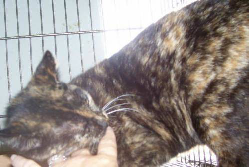
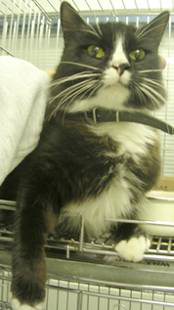
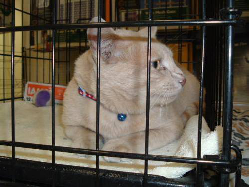
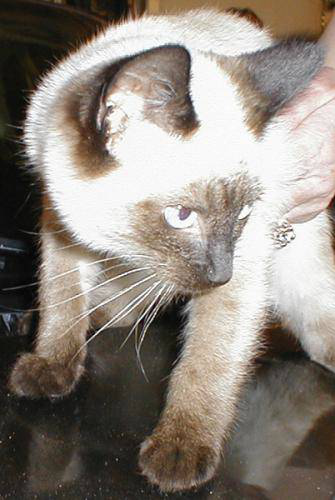
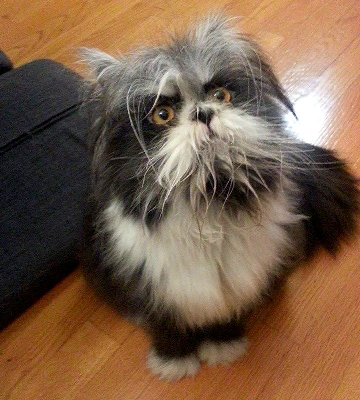
...
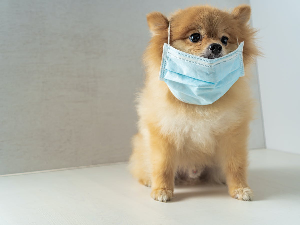
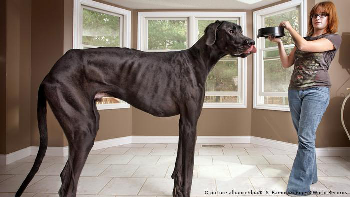
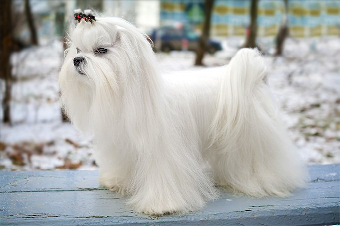
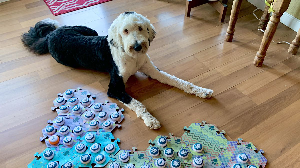
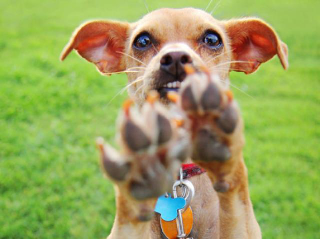

In [94]:
new_dataset.explore()